In [854]:
import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from math import sin, cos, sqrt, atan2, radians
from io import StringIO
import warnings
from scipy import stats
import seaborn as sns

import folium
from folium import plugins

# Part one
# 1.1Function of get distance

In [855]:
def dis(x):
    R = 6373.0
    lat1 = radians(float(x.pickup_latitude))
    lon1 = radians(float(x.pickup_longitude))
    lat2 = radians(float(x.dropoff_latitude))
    lon2 = radians(float(x.dropoff_longitude))

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

Test our function

In [856]:
df2 = pd.DataFrame(np.array([[50, 60, 60,60]]),
                   columns=['pickup_latitude', 'pickup_longitude', 'dropoff_latitude','dropoff_longitude'])

In [857]:
dis(df2)

1112.2983322959856

# 1.2 Get hourly and daily weather

In [858]:
W_data = pd.read_csv("2009_weather.csv")
W_data = W_data.append(pd.read_csv("2010_weather.csv"))
W_data = W_data.append(pd.read_csv("2011_weather.csv"))
W_data = W_data.append(pd.read_csv("2012_weather.csv"))
W_data = W_data.append(pd.read_csv("2013_weather.csv"))
W_data = W_data.append(pd.read_csv("2014_weather.csv"))
W_data = W_data.append(pd.read_csv("2015_weather.csv"))
W_data['DATE'] = pd.to_datetime(W_data['DATE'])
warnings.filterwarnings('ignore')

In [859]:
W_data=W_data[['DATE','HourlyWindSpeed','HourlyPrecipitation']].fillna('0')


In [860]:
def convert(x):
    if 'T' in x.HourlyPrecipitation:
        return 0
    elif 's' in x.HourlyPrecipitation:
        return x.HourlyPrecipitation[:-1]
    else:
        return x.HourlyPrecipitation

In [861]:
W_data['HourlyPrecipitation']=W_data.apply (lambda row: convert(row), axis=1)

In [862]:
W_data['HourlyPrecipitation'] = W_data['HourlyPrecipitation'].astype(float)

In [863]:
W_data['HourlyWindSpeed'] = W_data['HourlyWindSpeed'].astype(float)

In [864]:
daily_weather=W_data.groupby([W_data['DATE'].dt.date]).sum()/24

In [865]:
daily_weather.columns=['dailywindspeed','dailyprecipitation']

In [866]:
daily_weather.reset_index(inplace = True)

In [867]:
daily_weather

,DATE,dailywindspeed,dailyprecipitation
0,2009-01-01,11.041667,0.000000
1,2009-01-02,8.791667,0.000000
2,2009-01-03,9.875000,0.000000
3,2009-01-04,8.291667,0.000000
4,2009-01-05,7.791667,0.000000
...,...,...,...
2546,2015-12-27,9.208333,0.007083
2547,2015-12-28,8.208333,0.001250
2548,2015-12-29,15.250000,0.038750
2549,2015-12-30,6.625000,0.012083


In [868]:
W_data.reset_index(inplace = True)
W_data=W_data[['DATE','HourlyWindSpeed','HourlyPrecipitation']]
W_data

,DATE,HourlyWindSpeed,HourlyPrecipitation
0,2009-01-01 00:51:00,18.0,0.0
1,2009-01-01 01:51:00,18.0,0.0
2,2009-01-01 02:51:00,18.0,0.0
3,2009-01-01 03:51:00,8.0,0.0
4,2009-01-01 04:51:00,11.0,0.0
...,...,...,...
77967,2015-12-31 21:51:00,0.0,0.0
77968,2015-12-31 22:51:00,7.0,0.0
77969,2015-12-31 23:51:00,5.0,0.0
77970,2015-12-31 23:59:00,0.0,0.0


# 1.3 get urber data

In [869]:
U_data = pd.read_csv("uber_rides_sample.csv")
U_data = U_data.iloc[: , 1:]
U_data=U_data.drop('pickup_datetime',axis=1)
U_data['distance']=U_data.apply (lambda row: dis(row), axis=1)
U_data=U_data[(U_data['pickup_longitude']<-73.717047)&(U_data['pickup_longitude']>-74.242330)]
U_data=U_data[(U_data['dropoff_longitude']<-73.717047)&(U_data['dropoff_longitude']>-74.242330)]
U_data=U_data[(U_data['dropoff_latitude']<40.908524)&(U_data['dropoff_latitude']>40.560445)]
U_data=U_data[(U_data['pickup_latitude']<40.908524)&(U_data['pickup_latitude']>40.560445)]




In [870]:
U_data= U_data.reset_index(drop=True)
U_data.columns=['key','fare_amount','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','passenger_count','distance']


U_data


,key,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
0,2015-05-07 19:52:06.0000003,7.5,-73.999817,40.738354,-73.999512,40.723217,1,1.683851
1,2009-07-17 20:04:56.0000002,7.7,-73.994355,40.728225,-73.994710,40.750325,1,2.458361
2,2009-08-24 21:45:00.00000061,12.9,-74.005043,40.740770,-73.962565,40.772647,1,5.037958
3,2009-06-26 08:22:21.0000001,5.3,-73.976124,40.790844,-73.965316,40.803349,3,1.662205
4,2014-08-28 17:47:00.000000188,16.0,-73.925023,40.744085,-73.973082,40.761247,5,4.476855
...,...,...,...,...,...,...,...,...
195467,2012-10-28 10:49:00.00000053,3.0,-73.987042,40.739367,-73.986525,40.740297,1,0.112245
195468,2014-03-14 01:09:00.0000008,7.5,-73.984722,40.736837,-74.006672,40.739620,1,1.875639
195469,2009-06-29 00:42:00.00000078,30.9,-73.986017,40.756487,-73.858957,40.692588,2,12.854353
195470,2015-05-20 14:56:25.0000004,14.5,-73.997124,40.725452,-73.983215,40.695415,1,3.540827


# 1.4 Get yellow taxi data

In [871]:
import requests
from bs4 import BeautifulSoup
url = "https://www1.nyc.gov/site/tlc/about/tlc-trip-record-data.page" 
response = requests.get(url)
results_page = BeautifulSoup(response.content,'lxml')


In [872]:
a=results_page.find_all('a',{'title':"Yellow Taxi Trip Records"})


In [873]:
a=a[67:]
a.pop(6)
a.pop(6)
a.pop(6)
a.pop(6)
a.pop(6)
a.pop(6)


<a href="https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-12.csv" title="Yellow Taxi Trip Records">Yellow Taxi Trip Records</a>

In [2]:
np.random.seed(1)
yellow_sample=pd.DataFrame()
for x in a :
    C=['pickup_datetime','dropoff_datetime','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','tip_amount','total_amount']
    
    
    month=x.get('href')[-11:-4]
    req = requests.get(x.get('href'))
    data = StringIO(req.text)
    df=pd.read_csv(data,error_bad_lines=False)
    if '2015' in month:
        columns=['vendor_id','pickup_datetime','dropoff_datetime','passenger_count','trip_distance','pickup_longitude','pickup_latitude','rate_code','store_and_fwd_flag','dropoff_longitude','dropoff_latitude','payment_type','fare_amount','extra','mta_tax','tip_amount','tolls_amount','improvement_surcharge','total_amount']
        df.columns = columns
        df=df[C]
    
    else:
        columns=['vendor_id','pickup_datetime','dropoff_datetime','passenger_count','trip_distance','pickup_longitude','pickup_latitude','rate_code','store_and_fwd_flag','dropoff_longitude','dropoff_latitude','payment_type','fare_amount','surcharge','mta_tax','tip_amount','tolls_amount','total_amount']
        df.columns = columns
        df=df[C]
    df=df[(df['pickup_longitude']<-73.717047)&(df['pickup_longitude']>-74.242330)]
    df=df[(df['dropoff_longitude']<-73.717047)&(df['dropoff_longitude']>-74.242330)]
    df=df[(df['dropoff_latitude']<40.908524)&(df['dropoff_latitude']>40.560445)]
    df=df[(df['pickup_latitude']<40.908524)&(df['pickup_latitude']>40.560445)]
    df=df.sample(len(U_data[U_data['key'].str.contains(month)]))
    yellow_sample=yellow_sample.append(df)

        
    
    df.to_csv(x.get('href')[-11:], index = False, header=True)
    
    warnings.filterwarnings('ignore')


In [875]:
yellow_sample2=yellow_sample


In [876]:
yellow_sample2.reset_index(drop=True)

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,tip_amount,total_amount
0,2015-01-17 21:35:36,2015-01-17 21:47:09,-74.002998,40.739201,-73.999931,40.720470,0.00,10.80
1,2015-01-30 21:29:59,2015-01-30 21:51:50,-74.000549,40.747372,-73.950172,40.775494,3.66,21.96
2,2015-01-23 22:03:17,2015-01-23 22:10:29,-74.005569,40.745686,-73.988846,40.764999,1.50,10.30
3,2015-01-26 06:09:21,2015-01-26 06:12:47,-73.981224,40.759773,-73.994507,40.765923,0.00,5.30
4,2015-01-15 08:32:44,2015-01-15 08:52:59,-74.005653,40.745670,-73.981544,40.749874,2.85,17.15
...,...,...,...,...,...,...,...,...
195467,2009-12-16 22:35:00,2009-12-16 22:44:00,-73.989247,40.730552,-74.010608,40.713858,0.00,8.70
195468,2009-12-28 19:28:00,2009-12-28 19:43:00,-73.862582,40.769012,-73.980115,40.746665,0.00,26.57
195469,2009-12-13 14:53:00,2009-12-13 15:02:00,-73.970905,40.797998,-73.978487,40.778243,0.00,7.40
195470,2009-12-14 00:36:36,2009-12-14 01:02:45,-73.874514,40.774075,-73.990138,40.775420,0.00,31.67


In [877]:
yellow_sample2['distance']=yellow_sample2.apply (lambda row: dis(row), axis=1)

In [878]:
yellow_sample2=yellow_sample2.reset_index(drop=True)
yellow_sample2

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,tip_amount,total_amount,distance
0,2015-01-17 21:35:36,2015-01-17 21:47:09,-74.002998,40.739201,-73.999931,40.720470,0.00,10.80,2.099331
1,2015-01-30 21:29:59,2015-01-30 21:51:50,-74.000549,40.747372,-73.950172,40.775494,3.66,21.96,5.272360
2,2015-01-23 22:03:17,2015-01-23 22:10:29,-74.005569,40.745686,-73.988846,40.764999,1.50,10.30,2.569162
3,2015-01-26 06:09:21,2015-01-26 06:12:47,-73.981224,40.759773,-73.994507,40.765923,0.00,5.30,1.311521
4,2015-01-15 08:32:44,2015-01-15 08:52:59,-74.005653,40.745670,-73.981544,40.749874,2.85,17.15,2.084691
...,...,...,...,...,...,...,...,...,...
195467,2009-12-16 22:35:00,2009-12-16 22:44:00,-73.989247,40.730552,-74.010608,40.713858,0.00,8.70,2.586606
195468,2009-12-28 19:28:00,2009-12-28 19:43:00,-73.862582,40.769012,-73.980115,40.746665,0.00,26.57,10.209809
195469,2009-12-13 14:53:00,2009-12-13 15:02:00,-73.970905,40.797998,-73.978487,40.778243,0.00,7.40,2.288239
195470,2009-12-14 00:36:36,2009-12-14 01:02:45,-73.874514,40.774075,-73.990138,40.775420,0.00,31.67,9.740442


In [879]:
yellow_sample2.to_csv('yellow_sample.csv', index = False, header=True)

In [880]:
yellow_sample2['pickup_datetime'] = pd.to_datetime(yellow_sample2['pickup_datetime'])
yellow_sample2['dropoff_datetime'] = pd.to_datetime(yellow_sample2['dropoff_datetime'])


In [881]:
yellow_sample2

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,tip_amount,total_amount,distance
0,2015-01-17 21:35:36,2015-01-17 21:47:09,-74.002998,40.739201,-73.999931,40.720470,0.00,10.80,2.099331
1,2015-01-30 21:29:59,2015-01-30 21:51:50,-74.000549,40.747372,-73.950172,40.775494,3.66,21.96,5.272360
2,2015-01-23 22:03:17,2015-01-23 22:10:29,-74.005569,40.745686,-73.988846,40.764999,1.50,10.30,2.569162
3,2015-01-26 06:09:21,2015-01-26 06:12:47,-73.981224,40.759773,-73.994507,40.765923,0.00,5.30,1.311521
4,2015-01-15 08:32:44,2015-01-15 08:52:59,-74.005653,40.745670,-73.981544,40.749874,2.85,17.15,2.084691
...,...,...,...,...,...,...,...,...,...
195467,2009-12-16 22:35:00,2009-12-16 22:44:00,-73.989247,40.730552,-74.010608,40.713858,0.00,8.70,2.586606
195468,2009-12-28 19:28:00,2009-12-28 19:43:00,-73.862582,40.769012,-73.980115,40.746665,0.00,26.57,10.209809
195469,2009-12-13 14:53:00,2009-12-13 15:02:00,-73.970905,40.797998,-73.978487,40.778243,0.00,7.40,2.288239
195470,2009-12-14 00:36:36,2009-12-14 01:02:45,-73.874514,40.774075,-73.990138,40.775420,0.00,31.67,9.740442


# Part 2 Put data in database

In [882]:
from sqlalchemy import create_engine
from sqlalchemy.orm import declarative_base
import sqlalchemy as db

engine = db.create_engine(f"sqlite:///alldata.db")



In [883]:
yellow_command = """
CREATE TABLE IF NOT EXISTS yellow
(
    id INTEGER PRIMARY KEY,
    pickup_datetime DATETIME,
    dropoff_datetime DATETIME,
    pickup_longitude float,
    pickup_latitude float,
    dropoff_longitude float,
    dropoff_latitude float,
    tip_amount float,
    total_amount float,
    distance float  
    
)
"""
engine.execute(yellow_command)

In [884]:
yellow_sample2.to_sql('yellow', engine, if_exists='append',index=False)

In [885]:
uber_command = """
CREATE TABLE IF NOT EXISTS uber
(
    id INTEGER PRIMARY KEY,
    key DATETIME,
    fare_amount float,
    pickup_longitude float,
    pickup_latitude float,
    dropoff_longitude float,
    dropoff_latitude float,
    passenger_count,
    distance float  
    
)
"""
engine.execute(uber_command)

In [886]:
U_data.to_sql('uber', engine, if_exists='append',index=False)

In [887]:
dailyw_command = """
CREATE TABLE IF NOT EXISTS daily_w
(
    id INTEGER PRIMARY KEY,
    DATE DATE,
    dailywindspeed float,
    dailyprecipitation float
    
    
)
"""
engine.execute(dailyw_command)

In [888]:
daily_weather.to_sql('daily_w', engine, if_exists='append',index=False)

In [889]:
hourlyw_command = """
CREATE TABLE IF NOT EXISTS hourly_w
(
    id INTEGER PRIMARY KEY,
    DATE DATETIME,
    HourlyWindSpeed float,
    HourlyPrecipitation float
    
    
)
"""
engine.execute(dailyw_command)

In [890]:
W_data.to_sql('hourly_w', engine, if_exists='append',index=False)

# Part 3 Understanding data

1. For 01-2009 through 06-2015, what hour of the day was the most popular to take a Yellow Taxi? 

In [891]:

command = """
SELECT strftime('%H', pickup_datetime) as hour,count(*)
FROM yellow GROUP BY hour order by count(*) DESC LIMIT 1
"""
print(engine.execute(command).fetchall()[0][0],"is most popular hour")

19 is most popular hour


# PART 4 visulization

First we have to read data from database

In [892]:
yellow=pd.read_sql_table('yellow', engine)

In [893]:
uber=pd.read_sql_table('uber', engine)

In [894]:
hourly_w=pd.read_sql_table('hourly_w', engine)

In [895]:
daily_w=pd.read_sql_table('daily_w', engine)

1.Create an appropriate visualization for the first query/question in part 3.


<AxesSubplot:xlabel='pickup_datetime'>

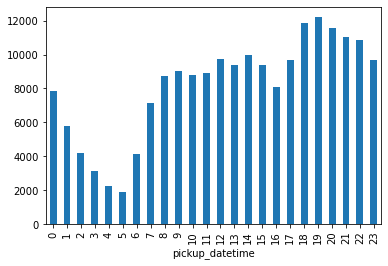

In [896]:
A=yellow.groupby(yellow['pickup_datetime'].dt.hour).count()['id']
A.plot(kind='bar')

2. Create a visualization that shows the average distance traveled per month (regardless of year - so group by each month) for both taxis and Ubers combined. Include the 90% confidence interval around the mean in the visualization.



In [897]:
uber_dis=uber[['key','distance']]
uber_dis.columns=['date','distance']

In [898]:
yellow_dis=yellow[['pickup_datetime','distance']]
yellow_dis.columns=['date','distance']

In [899]:
combine_dis=uber_dis.append(yellow_dis)

In [900]:
combine_dis=combine_dis[combine_dis['distance']>0]
combine_dis=combine_dis[combine_dis['distance']<2000]

In [901]:
combine_dis['month']=combine_dis['date'].dt.month

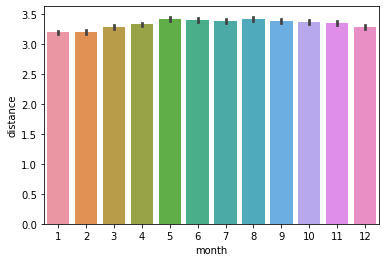

In [902]:
Q = sns.barplot(x="month", y="distance", ci=90,data=combine_dis)

3. Define three lat/long coordinate boxes around the three major New York airports: LGA, JFK, and EWR (you can use bboxfinder to help). Create a visualization that compares what day of the week was most popular for drop offs for each airport.


In [903]:
def drop_at_airport(x):
    if (-73.792925<x.dropoff_longitude<-73.7755) and (40.640846<x.dropoff_latitude<40.6491):

        return 'JFK'
    elif (-74.194224<x.dropoff_longitude<-74.172423) and (40.684608<x.dropoff_latitude<40.701333):
        return 'EWR'
    elif (-73.87764<x.dropoff_longitude<-73.86099) and (40.766896<x.dropoff_latitude<40.77534):
        return 'LGA'
    else:
        return 'Other' 

In [904]:
yellow_cor=yellow[['dropoff_datetime','dropoff_longitude','dropoff_latitude']]
uber_cor=uber[['key','dropoff_longitude','dropoff_latitude']]


In [905]:
yellow_cor.columns=['DATE','dropoff_longitude','dropoff_latitude']
uber_cor.columns=['DATE','dropoff_longitude','dropoff_latitude']


In [906]:
total_cor=yellow_cor.append(uber_cor)
total_cor

,DATE,dropoff_longitude,dropoff_latitude
0,2015-01-17 21:47:09,-73.999931,40.720470
1,2015-01-30 21:51:50,-73.950172,40.775494
2,2015-01-23 22:10:29,-73.988846,40.764999
3,2015-01-26 06:12:47,-73.994507,40.765923
4,2015-01-15 08:52:59,-73.981544,40.749874
...,...,...,...
195467,2012-10-28 10:49:00,-73.986525,40.740297
195468,2014-03-14 01:09:00,-74.006672,40.739620
195469,2009-06-29 00:42:00,-73.858957,40.692588
195470,2015-05-20 14:56:25,-73.983215,40.695415


In [907]:
total_cor['airport']=total_cor.apply (lambda row: drop_at_airport(row), axis=1)

In [908]:
JFK=total_cor[total_cor['airport']=='JFK']
EWR=total_cor[total_cor['airport']=='EWR']
LGA=total_cor[total_cor['airport']=='LGA']

For jfk airport is sunday


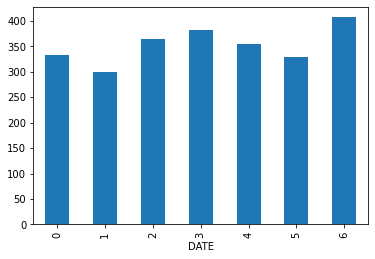

In [909]:
JFK.groupby(JFK['DATE'].dt.weekday).count()['airport'].plot(kind='bar')
print('For jfk airport is sunday')

For EWR airport is sunday


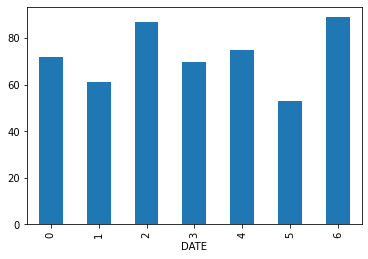

In [910]:
EWR.groupby(EWR['DATE'].dt.weekday).count()['airport'].plot(kind='bar')
print('For EWR airport is sunday')

For LGA airport is Thursday


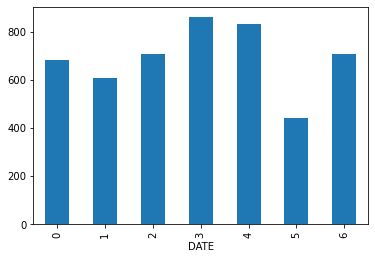

In [912]:
LGA.groupby(LGA['DATE'].dt.weekday).count()['airport'].plot(kind='bar')
print('For LGA airport is Thursday')

4.Create a heatmap of all hired trips over a map of the area. Consider using KeplerGL or another library that helps generate geospatial visualizations.


In [913]:
total_cor

,DATE,dropoff_longitude,dropoff_latitude,airport
0,2015-01-17 21:47:09,-73.999931,40.720470,Other
1,2015-01-30 21:51:50,-73.950172,40.775494,Other
2,2015-01-23 22:10:29,-73.988846,40.764999,Other
3,2015-01-26 06:12:47,-73.994507,40.765923,Other
4,2015-01-15 08:52:59,-73.981544,40.749874,Other
...,...,...,...,...
195467,2012-10-28 10:49:00,-73.986525,40.740297,Other
195468,2014-03-14 01:09:00,-74.006672,40.739620,Other
195469,2009-06-29 00:42:00,-73.858957,40.692588,Other
195470,2015-05-20 14:56:25,-73.983215,40.695415,Other


In [914]:
m = folium.Map([40.747257, -73.977814], zoom_start=11)
stationArr = total_cor[['dropoff_latitude', 'dropoff_longitude']].values

# plot heatmap
m.add_children(plugins.HeatMap(stationArr, radius=15))
m

5. Create a scatter plot that compares tip amount versus distance for Yellow Taxi rides. You may remove any outliers how you see fit.


In [915]:
A=yellow[yellow['distance']<30]
A=A[A['distance']>0]


In [916]:
A=A[A['tip_amount']<20]
A=A[A['tip_amount']>0]

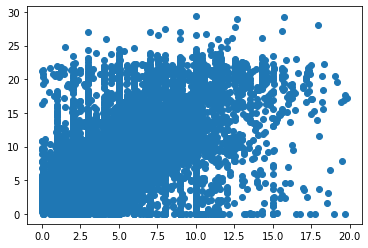

In [917]:
plt.scatter(A["tip_amount"], A["distance"])

6. Create another scatter plot that compares tip amount versus precipitation amount for Yellow Taxi rides. You may remove any outliers how you see fit.


In [918]:
A=yellow[['dropoff_datetime','tip_amount']]
A['dropoff_datetime']=A['dropoff_datetime'].dt.date

In [919]:
daily_w

,id,DATE,dailywindspeed,dailyprecipitation
0,1,2009-01-01,11.041667,0.000000
1,2,2009-01-02,8.791667,0.000000
2,3,2009-01-03,9.875000,0.000000
3,4,2009-01-04,8.291667,0.000000
4,5,2009-01-05,7.791667,0.000000
...,...,...,...,...
2546,2547,2015-12-27,9.208333,0.007083
2547,2548,2015-12-28,8.208333,0.001250
2548,2549,2015-12-29,15.250000,0.038750
2549,2550,2015-12-30,6.625000,0.012083


In [920]:
A.columns=['DATE','tip_amount']
A

,DATE,tip_amount
0,2015-01-17,0.00
1,2015-01-30,3.66
2,2015-01-23,1.50
3,2015-01-26,0.00
4,2015-01-15,2.85
...,...,...
195467,2009-12-16,0.00
195468,2009-12-28,0.00
195469,2009-12-13,0.00
195470,2009-12-14,0.00


In [921]:
B=A.set_index('DATE').join(daily_w.set_index('DATE'))
B=B[B['tip_amount']<30]
B=B[B['dailyprecipitation']>=0.0]
B

,tip_amount,id,dailywindspeed,dailyprecipitation
DATE,,,,
2009-01-01,0.00,1.0,11.041667,0.000000
2009-01-01,0.00,1.0,11.041667,0.000000
2009-01-01,0.00,1.0,11.041667,0.000000
2009-01-01,0.00,1.0,11.041667,0.000000
2009-01-01,0.00,1.0,11.041667,0.000000
...,...,...,...,...
2015-06-30,0.00,2367.0,6.125000,0.003333
2015-06-30,0.00,2367.0,6.125000,0.003333
2015-06-30,1.00,2367.0,6.125000,0.003333


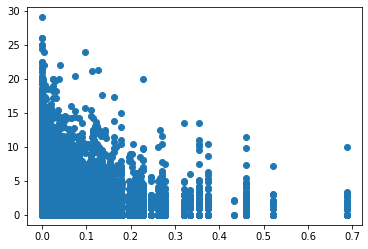

In [922]:
plt.scatter(B["dailyprecipitation"], B["tip_amount"])


7. what month of the year has least number of uber order from 2019 to 2015?


In [923]:
F=uber.groupby(uber['key'].dt.month).count()['id']

It is August 


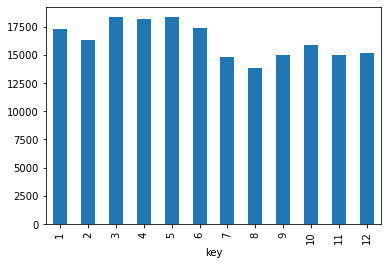

In [924]:
F.plot(kind='bar')
print('It is August ')

8. For 01-2009 through 06-2015, what day of the month was the most popular to take a uber?

In [925]:
F=uber.groupby(uber['key'].dt.day).count()['id']

It is 8th in a month 


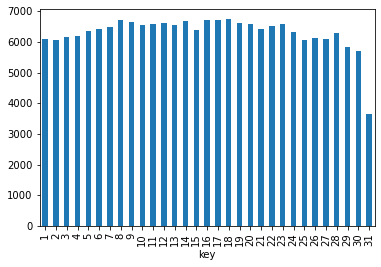

In [926]:
F.plot(kind='bar')
print('It is 8th in a month ')

3. For top 1 daily windspeed day from 01-2009 to 06-2015, which hour has most number of trip?


In [927]:
A=daily_w.sort_values(by='dailywindspeed',ascending=False).head(1)[['DATE','dailywindspeed']]
A

,DATE,dailywindspeed
433,2010-03-13,45.875


In [928]:
B=total_cor[total_cor['DATE']>'2010-03-13']
B=B[B['DATE']<='2010-03-14']
B

,DATE,dropoff_longitude,dropoff_latitude,airport
140434,2010-03-13 13:03:19,-73.962278,40.770372,Other
140487,2010-03-13 21:57:00,-73.997168,40.719847,Other
140508,2010-03-13 21:08:00,-73.954973,40.787230,Other
140533,2010-03-13 19:07:00,-73.946025,40.714528,Other
140553,2010-03-13 02:19:06,-73.784936,40.726189,Other
...,...,...,...,...
185010,2010-03-13 08:18:00,-73.984700,40.747408,Other
187046,2010-03-13 12:05:00,-73.945072,40.808295,Other
189106,2010-03-13 00:37:51,-73.998978,40.729991,Other
189176,2010-03-13 16:09:35,-73.977891,40.764601,Other


In [929]:
F=B.groupby(B['DATE'].dt.hour).count()['airport']

It is 10 am in the morning


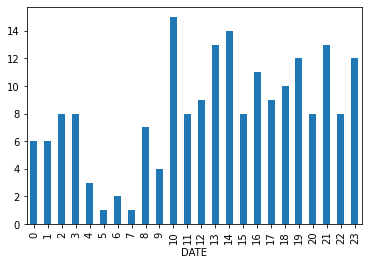

In [930]:
F.plot(kind='bar')
print('It is 10 am in the morning')